In [81]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imutils
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours


In [82]:
def display(img, cmap='gray'):
    # fig = plt.figure(figsize=(11.69,8.27)) # A4 사이즈
    fig = plt.figure(figsize=(16.53, 11.69))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap='gray')

In [83]:
network = load_model('network')
network.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 6, 6, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 3, 3, 128)         0

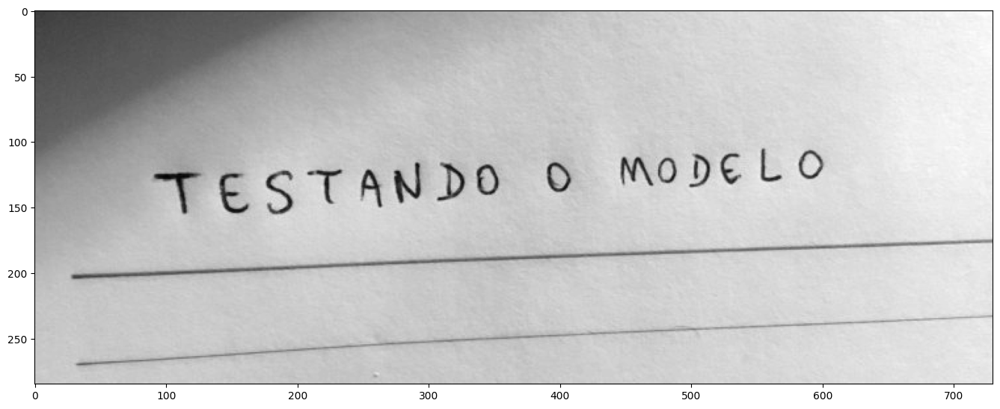

In [84]:
# Loading the Test Image
img = cv2.imread('./OCR_with_Python/Images/test-manuscript01.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
display(gray_img)

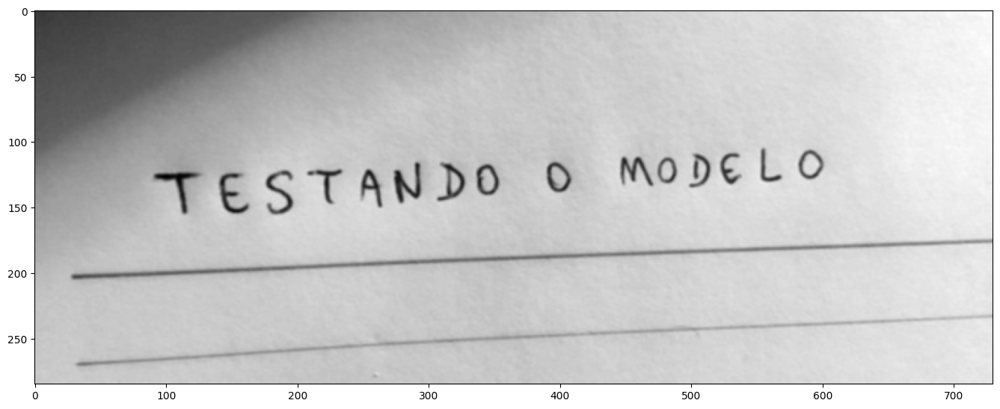

In [85]:
# Pre-Processing the Image
blur = cv2.GaussianBlur(gray_img, (3,3), 0)

display(blur)

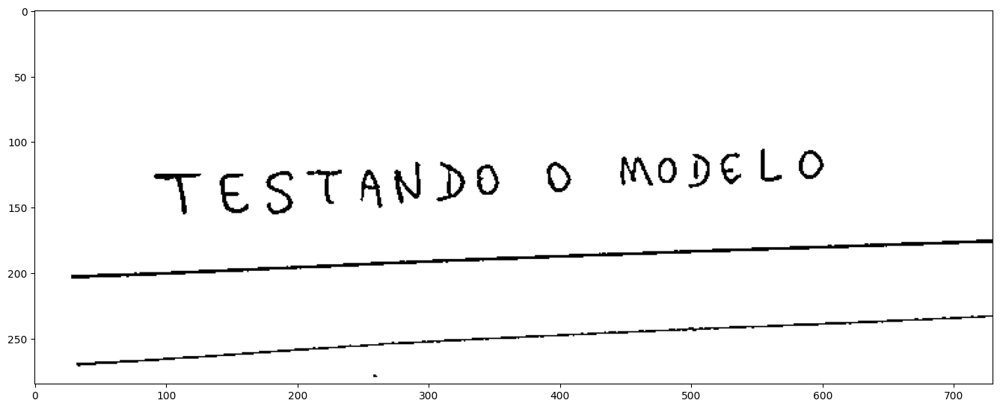

In [86]:
adaptive = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
display(adaptive)

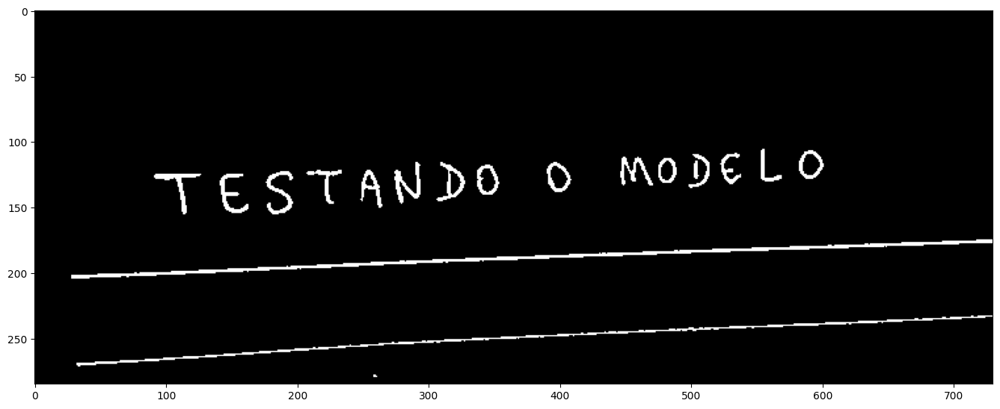

In [87]:
invertion = 255 - adaptive
display(invertion)

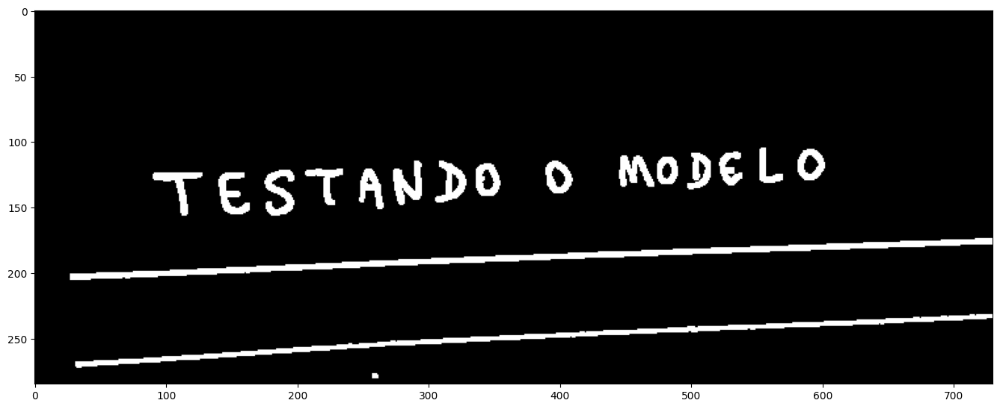

In [88]:
dilation = cv2.dilate(invertion, np.ones((3, 3)))
display(dilation)

In [89]:
# 엣지 추출을 하고 확장을 하게 되면 M과 O가 붙어서 MO를 하나로 감지 함.
# 그래서 엣지 추출과 확장을 하지 않음.
# edge = cv2.Canny(dilation, 40, 150)
# display(edge)

In [90]:
# dilation = cv2.dilate(edge, np.ones((3, 3)))
# display(dilation)

In [91]:
# Contour Derection
def find_contours(img):
    conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    conts = imutils.grab_contours(conts)
    conts = sort_contours(conts, method='left-to-right')[0]
    return conts

In [92]:
conts = find_contours(dilation.copy())

In [93]:
conts

(array([[[716, 174]],
 
        [[715, 175]],
 
        [[690, 175]],
 
        [[689, 176]],
 
        [[659, 176]],
 
        [[658, 177]],
 
        [[631, 177]],
 
        [[630, 178]],
 
        [[603, 178]],
 
        [[602, 179]],
 
        [[574, 179]],
 
        [[573, 180]],
 
        [[545, 180]],
 
        [[544, 181]],
 
        [[515, 181]],
 
        [[514, 182]],
 
        [[486, 182]],
 
        [[485, 183]],
 
        [[462, 183]],
 
        [[461, 184]],
 
        [[429, 184]],
 
        [[428, 185]],
 
        [[406, 185]],
 
        [[405, 186]],
 
        [[380, 186]],
 
        [[379, 187]],
 
        [[351, 187]],
 
        [[350, 188]],
 
        [[327, 188]],
 
        [[326, 189]],
 
        [[302, 189]],
 
        [[301, 190]],
 
        [[277, 190]],
 
        [[276, 191]],
 
        [[255, 191]],
 
        [[254, 192]],
 
        [[234, 192]],
 
        [[233, 193]],
 
        [[214, 193]],
 
        [[213, 194]],
 
        [[191, 194]],
 
        [[190, 1

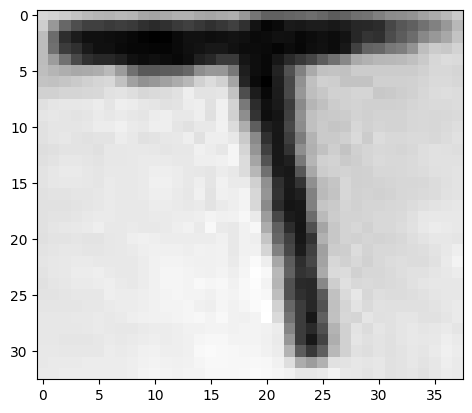

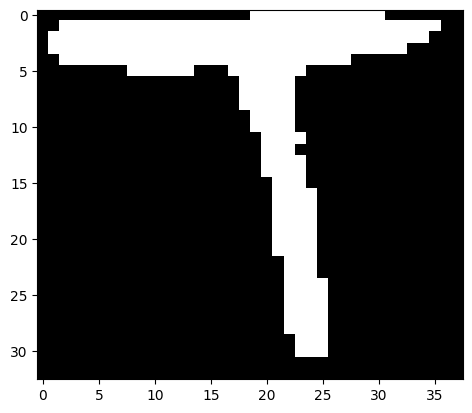

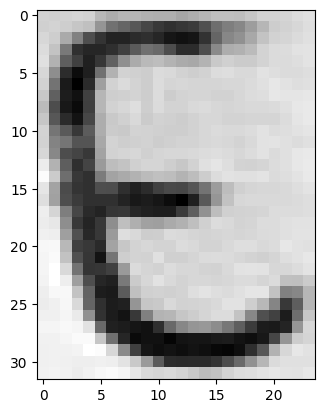

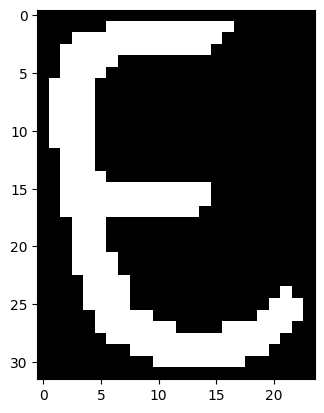

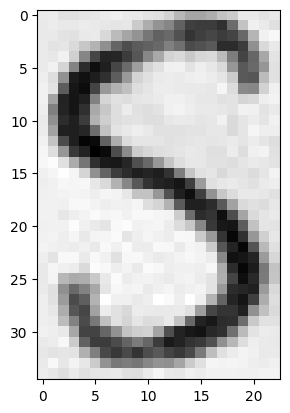

...

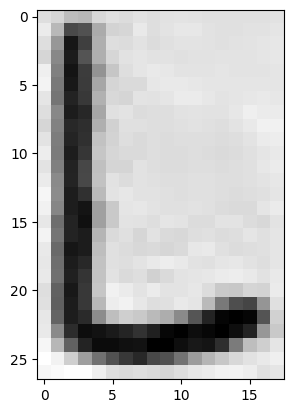

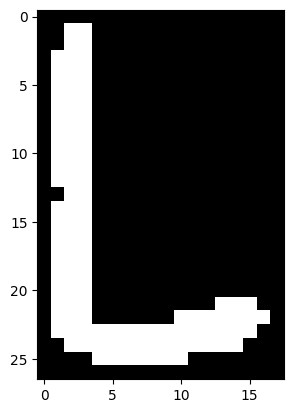

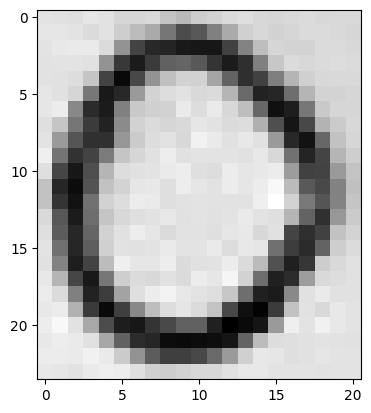

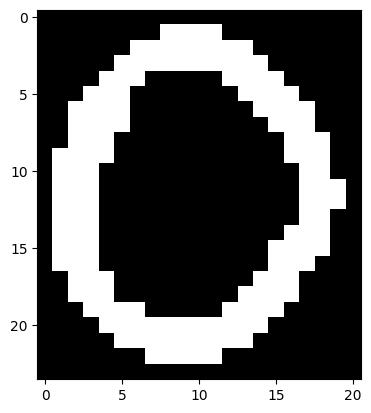

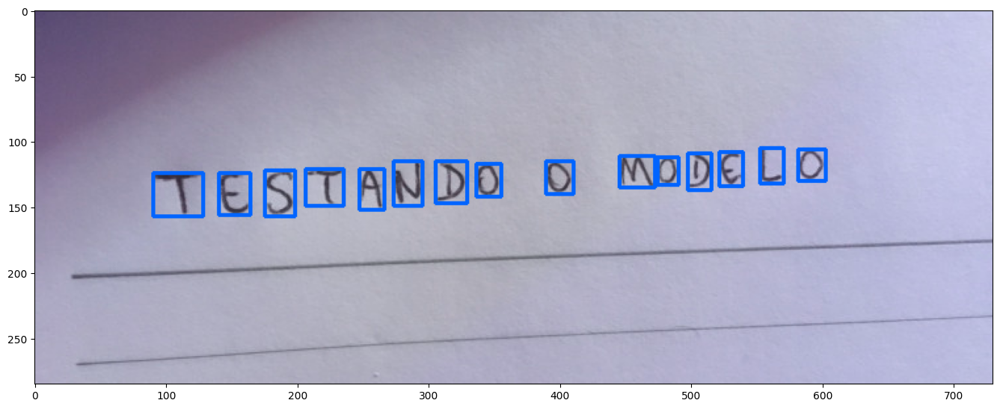

In [94]:
min_w, max_w = 4, 160
min_h, max_h = 14, 140
img_copy = img.copy()
for c in conts:
    # print(c)
    (x, y, w, h) = cv2.boundingRect(c)
    if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
        roi = gray_img[y:y+h, x:x+w]
        plt.imshow(roi, cmap='gray')
        plt.show()
        thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        # display(roi)
        plt.imshow(thresh, cmap='gray')
        plt.show()
        cv2.rectangle(img_copy, (x, y), (x+w, y+h), (0, 100, 255), 2)

display(img_copy)

In [95]:
# Processing the detected characters
# ROI extraction

def extract_roi(img):
    roi = img[y:y+h, x:x+w]
    return roi

In [96]:
# Threshholding
def thresholding(img):
    thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    return thresh

In [97]:
# Resizing
# 이미지의 사이즈를 28x28로 만들고 정사각형이 아닌경우
# 이미지를 중앙정렬 한 다음에 남는 공간을 검은색 배경으로 채움.
def resizing(img, w, h):
    if w > h:
        resized = imutils.resize(img, width=28)
    else:
        resized = imutils.resize(img, height=28)
    
    (h, w) = resized.shape
    dx = int(max(0, 28 - w) / 2.0)  # 남는 공간(X축) 계산 식
    dy = int(max(0, 28 - h) / 2.0)  # 남는 공간(Y축) 계산 식

    filled = cv2.copyMakeBorder(resized, top=dy, bottom=dy, left=dx, right=dx, borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))
    filled = cv2.resize(filled, (28, 28))

    return filled

247 121 19 31


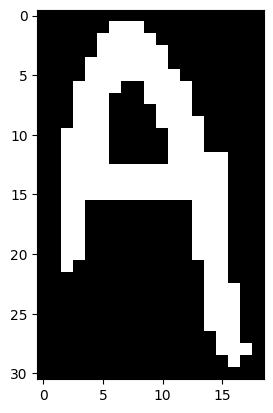

31 19


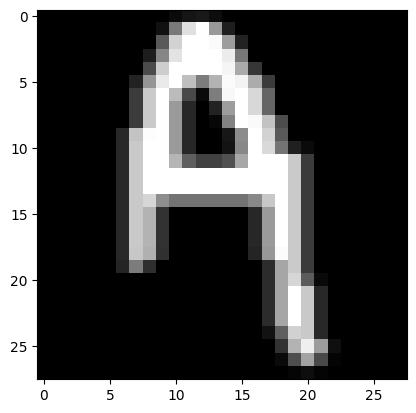

(28, 28)


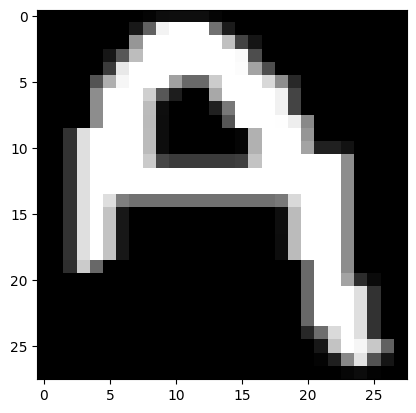

In [98]:
(x, y, w, h) = cv2.boundingRect(conts[6])
print(x, y, w, h)
test_img = thresholding(gray_img[y:y+h, x:x+w])
plt.imshow(test_img, cmap='gray')
plt.show()
(h, w) = test_img.shape
print(h, w)
test_img2 = resizing(test_img, w, h)
plt.imshow(test_img2, cmap='gray')
plt.show()
print(test_img2.shape)
# 아래와 같이 그냥 사이즈만 변경 하면 문자의 변형이 발생 하여 정확한 문자 추출이 안되기 때문에 문자는 유지하고 주변에 검은색으로 채워야 한다.
plt.imshow(cv2.resize(test_img, (28, 28)), cmap='gray')
plt.show()

In [99]:
# Normalization
def normalization(img):
    img = img.astype('float32') / 255.0
    img = np.expand_dims(img, axis = -1)
    return img

In [100]:
test_img2.shape, normalization(test_img2).shape

((28, 28), (28, 28, 1))

In [101]:
# Processing the detections
characters = []

def process_box(gray, x, y, w, h):
    roi = extract_roi(gray)
    thresh = thresholding(roi)
    (h, w) = thresh.shape
    resized = resizing(thresh, w, h)
    plt.imshow(resized, cmap='gray')
    plt.show()
    normalized = normalization(resized)
    characters.append((normalized, (x, y, w, h)))

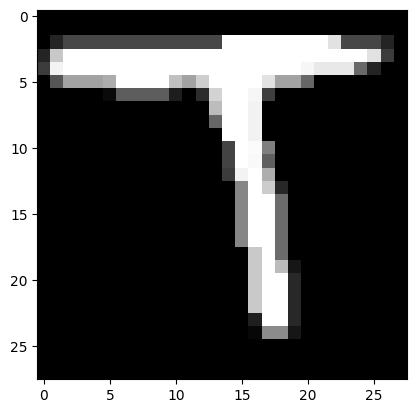

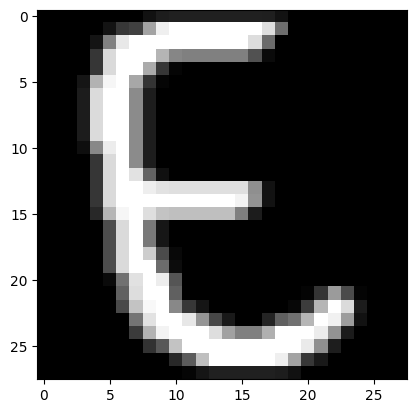

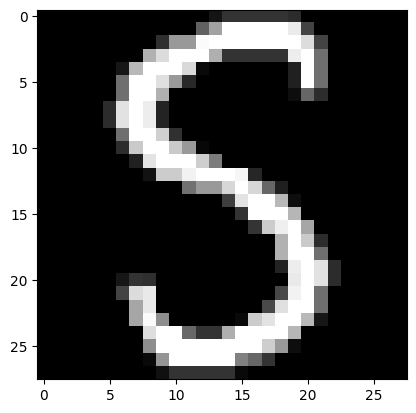

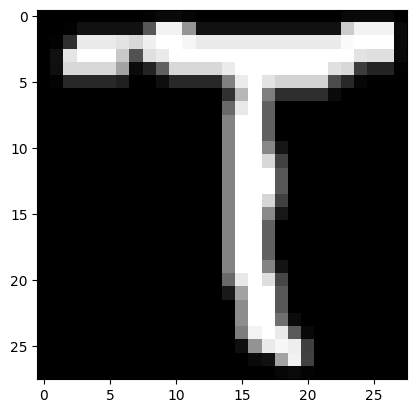

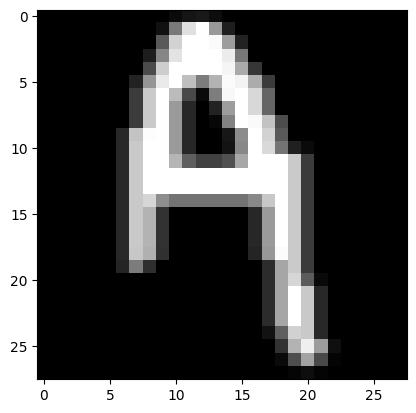

...

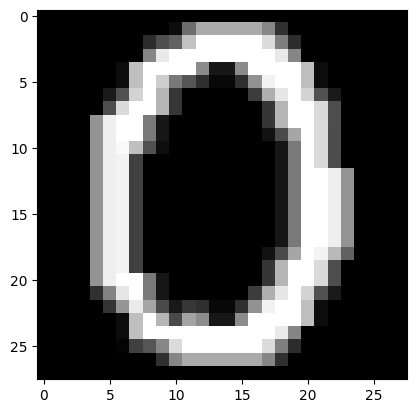

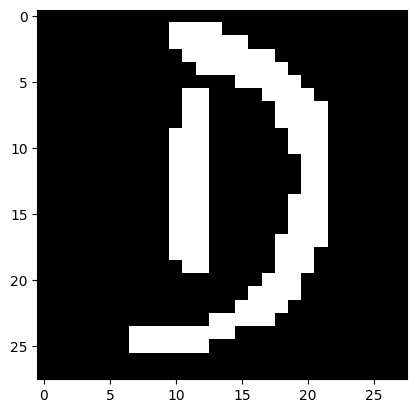

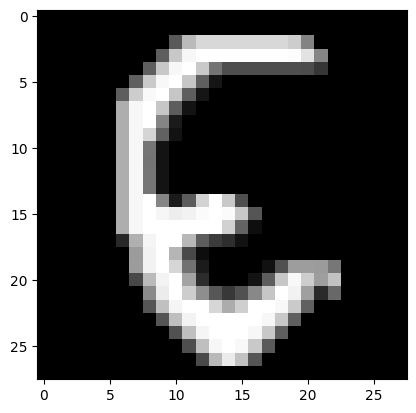

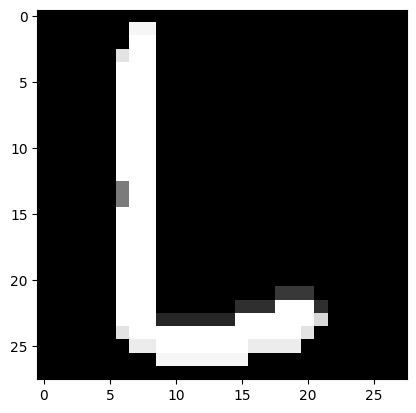

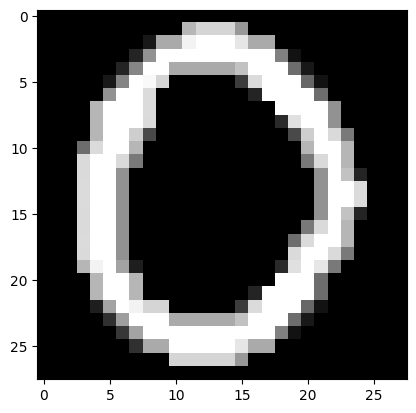

In [102]:
for c in conts:
    # print(c)
    (x, y, w, h) = cv2.boundingRect(c)
    if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
        process_box(gray_img, x, y, w, h)

In [103]:
characters[0]

(array([[[0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ]],
 
        [[0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
        

In [104]:
# 이미지에서 찾은 문자의 경계선 박스들
boxes = [box[1] for box in characters]
boxes

[(90, 124, 38, 33),
 (140, 124, 24, 32),
 (175, 122, 23, 35),
 (206, 121, 29, 28),
 (247, 121, 19, 31),
 (273, 115, 22, 34),
 (305, 115, 24, 32),
 (336, 117, 19, 25),
 (389, 115, 21, 25),
 (445, 111, 27, 24),
 (474, 112, 16, 21),
 (497, 109, 18, 28),
 (521, 108, 18, 26),
 (552, 105, 18, 27),
 (581, 106, 21, 24)]

In [105]:
# 이미지에서 찾은 문자들의 픽셀정보
pixels = np.array([pixel[0] for pixel in characters], dtype='float32')

In [106]:
pixels

array([[[[0.        ],
         [0.        ],
         [0.        ],
         ...,
         [0.        ],
         [0.        ],
         [0.        ]],

        [[0.        ],
         [0.        ],
         [0.        ],
         ...,
         [0.        ],
         [0.        ],
         [0.        ]],

        [[0.        ],
         [0.14509805],
         [0.27450982],
         ...,
         [0.27450982],
         [0.14509805],
         [0.        ]],

        ...,

        [[0.        ],
         [0.        ],
         [0.        ],
         ...,
         [0.        ],
         [0.        ],
         [0.        ]],

        [[0.        ],
         [0.        ],
         [0.        ],
         ...,
         [0.        ],
         [0.        ],
         [0.        ]],

        [[0.        ],
         [0.        ],
         [0.        ],
         ...,
         [0.        ],
         [0.        ],
         [0.        ]]],


       [[[0.        ],
         [0.        ],
         [0.  

In [107]:
# 문자인식
digits = '0123456789'
letters = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
character_list = digits + letters
character_list = [character for character in character_list]
print(character_list)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [108]:
pixels[0].shape

(28, 28, 1)

In [109]:
# 28 x 28의 gray scale의 문자를 15개 찾음
pixels.shape

(15, 28, 28, 1)

In [110]:
# 트레이닝 한 값들과 비교 하여 문자로 예측 되는 값들을 가져 옴.
predictions = network.predict(pixels)

1/1 [==============================] - 0s 53ms/step


In [111]:
predictions

array([[5.83765747e-25, 1.69857618e-14, 2.03948932e-14, 6.93462350e-14,
        2.46759189e-12, 2.26065144e-09, 4.71409100e-21, 1.84962834e-09,
        1.16690742e-15, 1.78631680e-18, 1.47848383e-11, 3.37416206e-12,
        3.80563029e-12, 6.75817111e-11, 3.58261354e-13, 8.70052253e-14,
        1.72383352e-08, 4.37643366e-10, 9.70964138e-16, 6.01046522e-05,
        1.03896086e-10, 1.02405701e-15, 3.16798793e-14, 2.00716269e-17,
        1.17094867e-09, 3.52639115e-13, 1.62634203e-18, 1.05280544e-13,
        1.59745042e-07, 9.99041975e-01, 8.97696998e-04, 1.88115814e-24,
        7.99026179e-22, 2.92539298e-10, 4.99247355e-09, 3.16828480e-10],
       [3.53727535e-18, 3.30398373e-22, 2.29601748e-15, 1.84263254e-20,
        8.82405361e-16, 1.10355347e-06, 4.08102219e-09, 6.54134873e-21,
        5.84344626e-08, 1.53275843e-13, 1.24564725e-11, 9.56989297e-08,
        8.10525904e-08, 9.80649074e-14, 9.99995351e-01, 3.13511464e-06,
        1.65137820e-07, 3.13614864e-14, 1.72464650e-19, 3.57312

In [112]:
predictions.shape

(15, 36)

In [113]:
boxes

[(90, 124, 38, 33),
 (140, 124, 24, 32),
 (175, 122, 23, 35),
 (206, 121, 29, 28),
 (247, 121, 19, 31),
 (273, 115, 22, 34),
 (305, 115, 24, 32),
 (336, 117, 19, 25),
 (389, 115, 21, 25),
 (445, 111, 27, 24),
 (474, 112, 16, 21),
 (497, 109, 18, 28),
 (521, 108, 18, 26),
 (552, 105, 18, 27),
 (581, 106, 21, 24)]

T
T  ->  99.90419745445251


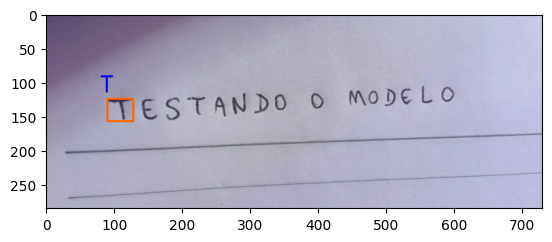

E
E  ->  99.99953508377075


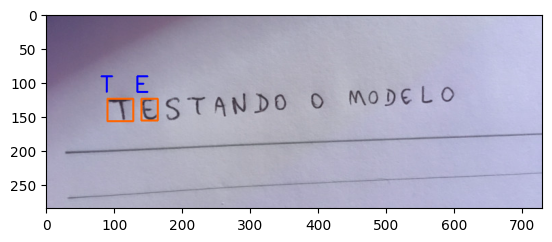

5
5  ->  77.26564407348633


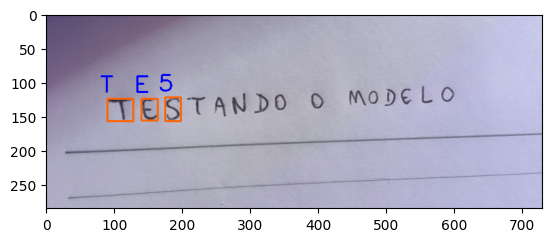

T
T  ->  99.99767541885376


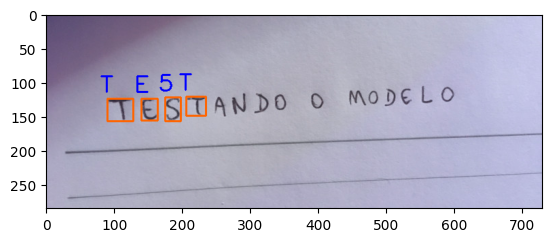

A
A  ->  99.99346733093262


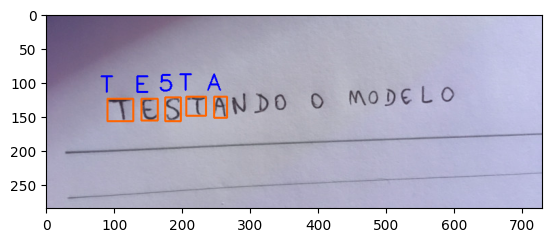

N
N  ->  99.93593096733093


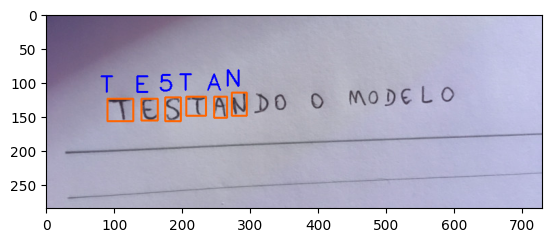

D
D  ->  99.99834299087524


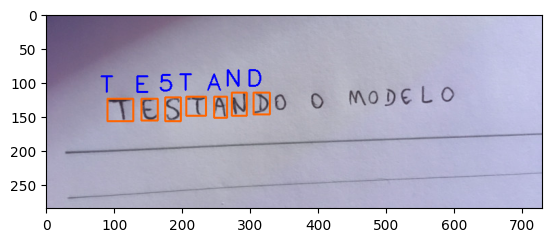

O
O  ->  78.61836552619934


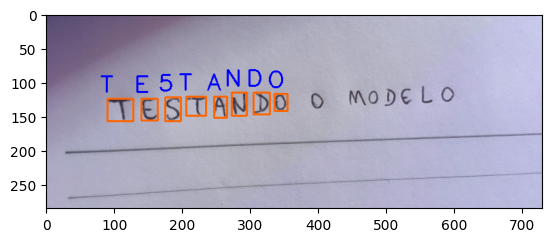

O
O  ->  56.516098976135254


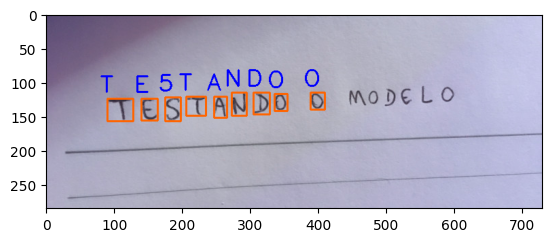

M
M  ->  99.28227066993713


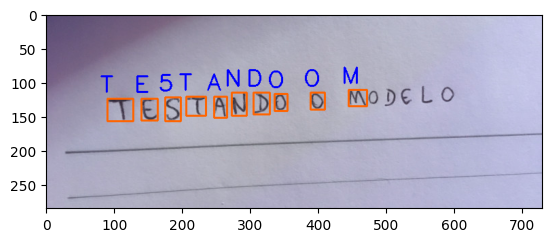

O
O  ->  48.57099950313568


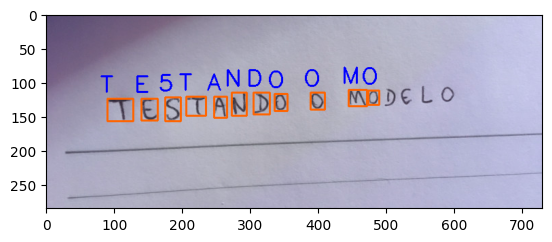

D
D  ->  96.91094160079956


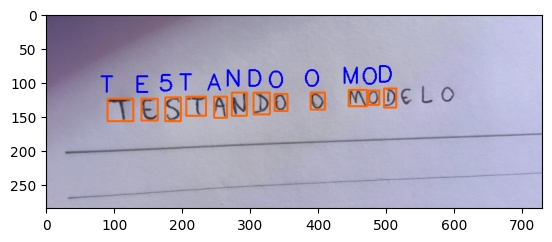

E
E  ->  99.98652935028076


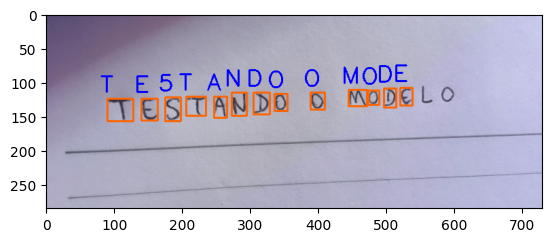

L
L  ->  99.99879598617554


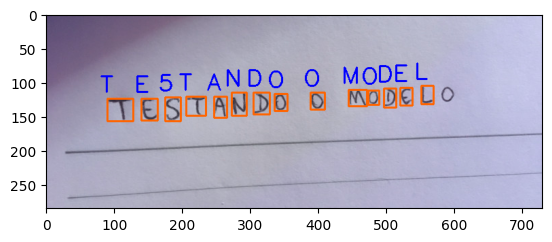

0
0  ->  78.28857898712158


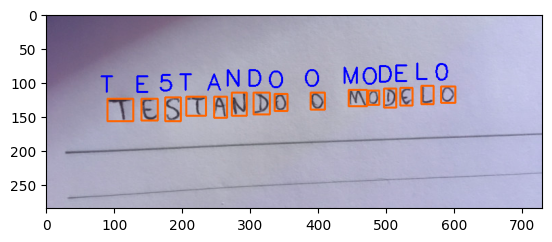

In [114]:
img_copy = img.copy()

for (prediction, (x, y, w, h)) in zip(predictions, boxes):
    i = np.argmax(prediction)
    # print(i)
    probability = prediction[i]
    # print(probability)
    character = character_list[i]
    print(character)

    cv2.rectangle(img_copy, (x, y), (x+w, y+h), (255, 100, 0), 2)
    cv2.putText(img_copy, character, (x - 10,y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0, 0, 255), 2)
    print(character, ' -> ', probability * 100)
    plt.imshow(img_copy, cmap='gray')
    plt.show()

In [117]:
# 정리

In [118]:
# ROI extraction(이미지 추출) 재정의

def extract_roi(img, margin = 2):
    roi = img[y - margin:y+h, x - margin:x + w + margin]
    return roi

def process_box(gray, x, y, w, h):
    roi = extract_roi(gray)
    thresh = thresholding(roi)
    (h, w) = thresh.shape
    resized = resizing(thresh, w, h)
    plt.imshow(resized, cmap='gray')
    plt.show()
    normalized = normalization(resized)
    return (normalized, (x, y, w, h))
    # characters.append((normalized, (x, y, w, h)))

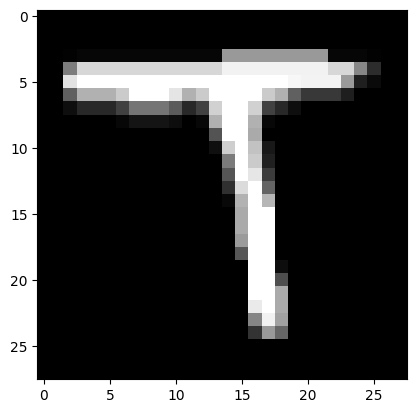

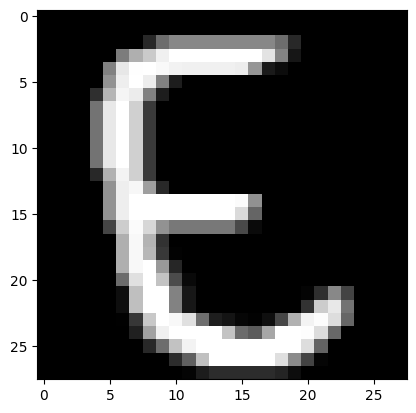

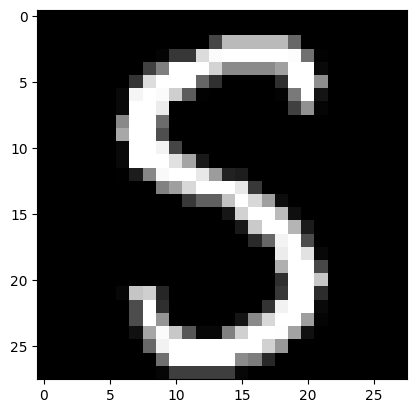

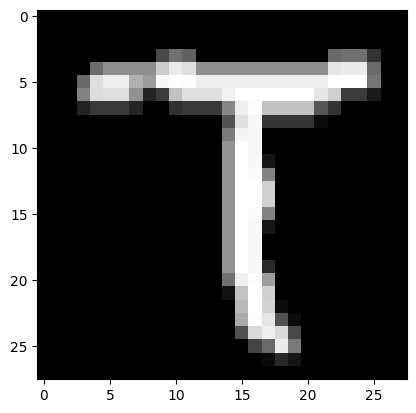

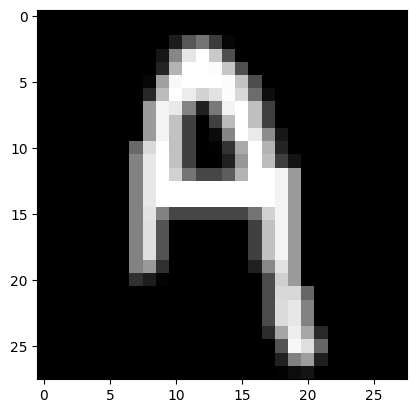

...

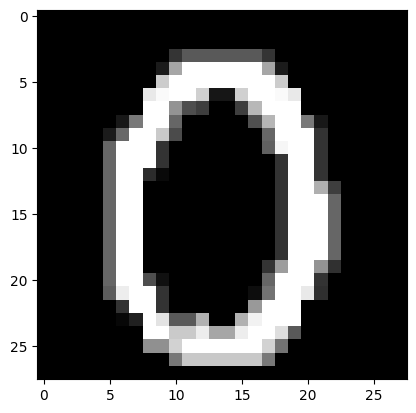

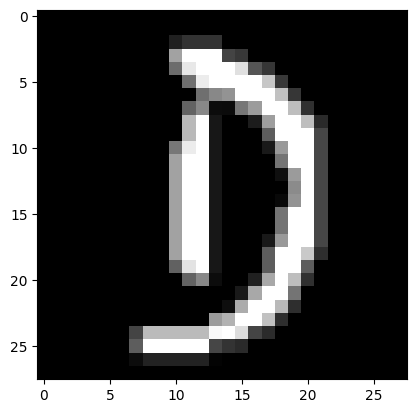

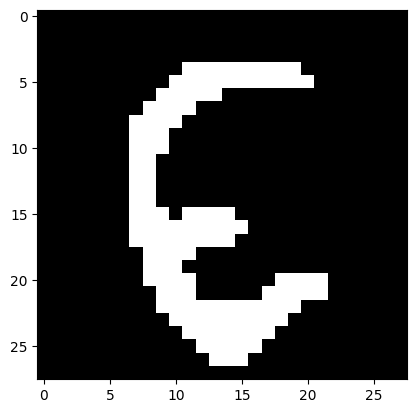

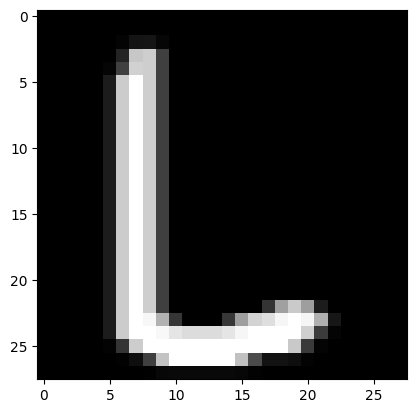

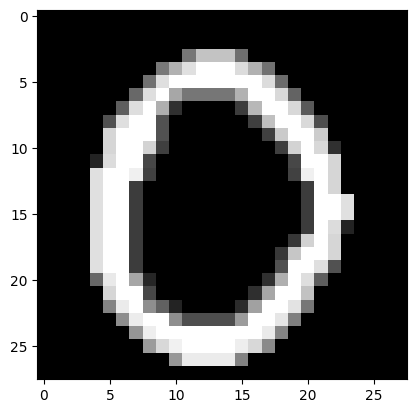

1/1 [==============================] - 0s 29ms/step


In [119]:
conts = find_contours(dilation.copy())
characters = []

for c in conts:
    (x, y, w, h) = cv2.boundingRect(c)
    if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
        characters.append(process_box(gray_img, x, y, w, h))

pixels = np.array([p[0] for p in characters], dtype='float32')
boxes = [b[1] for b in characters]
predictions = network.predict(pixels)

T  ->  99.97941851615906


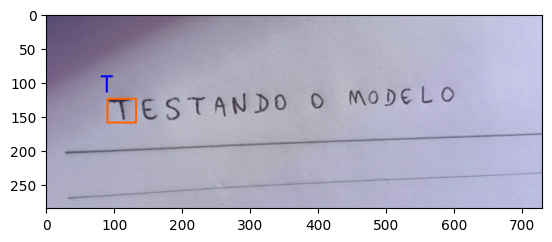

E  ->  99.99994039535522


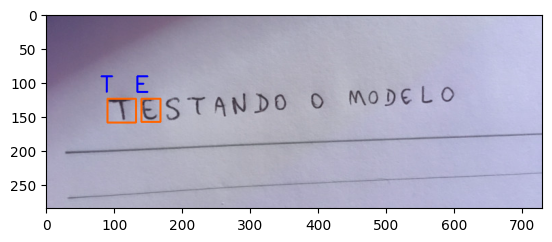

S  ->  73.8031804561615


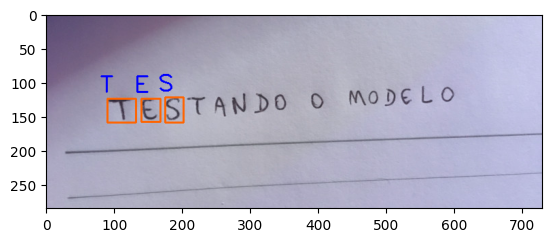

T  ->  99.98902082443237


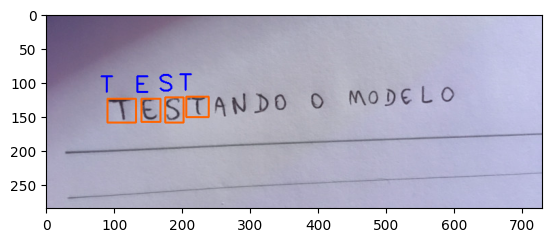

A  ->  99.98635053634644


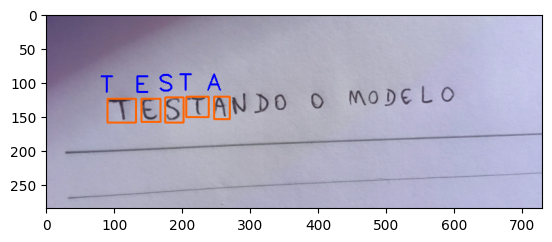

N  ->  99.96789693832397


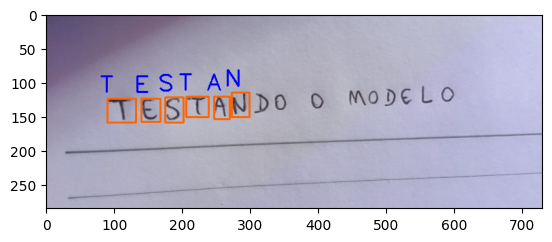

D  ->  99.98056292533875


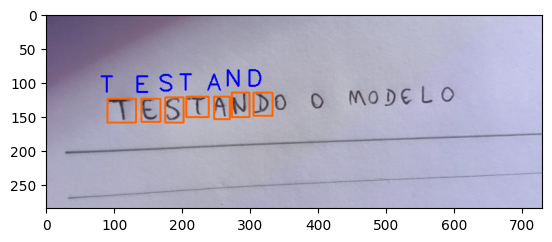

0  ->  37.81631290912628


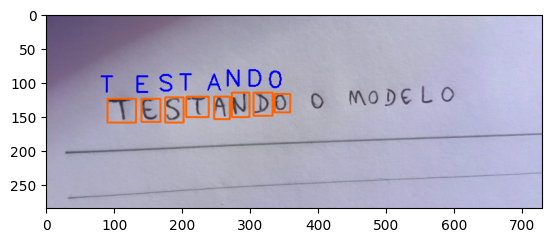

O  ->  51.22615694999695


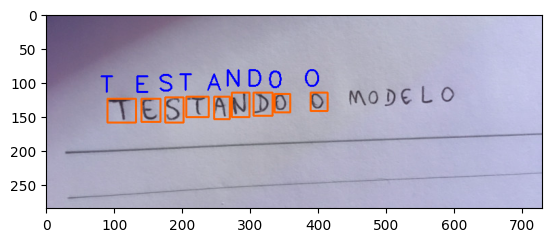

M  ->  99.99916553497314


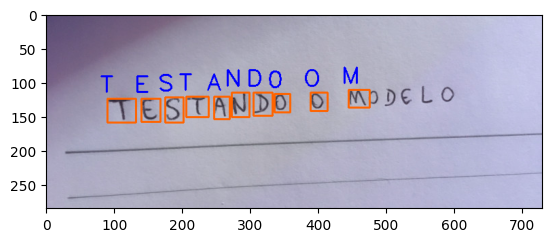

0  ->  96.4360773563385


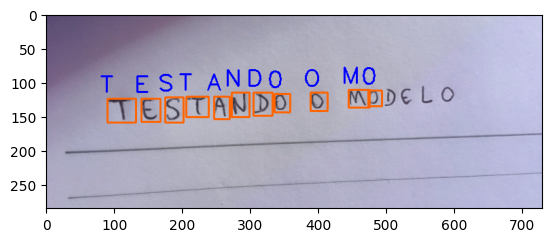

D  ->  98.15319776535034


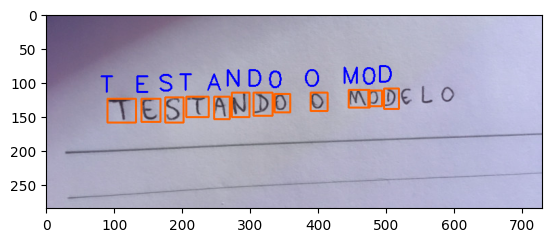

E  ->  99.96267557144165


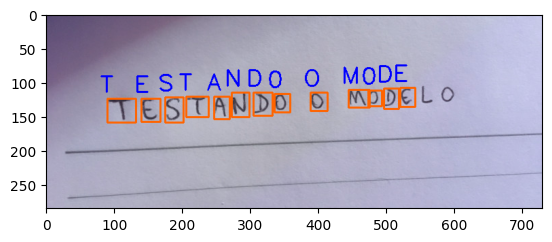

L  ->  99.99319314956665


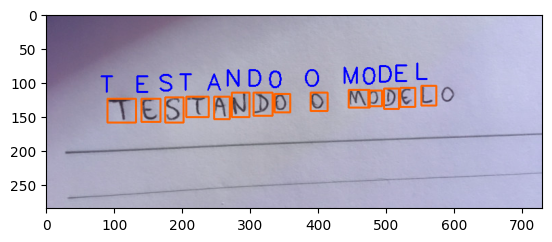

0  ->  66.43595695495605


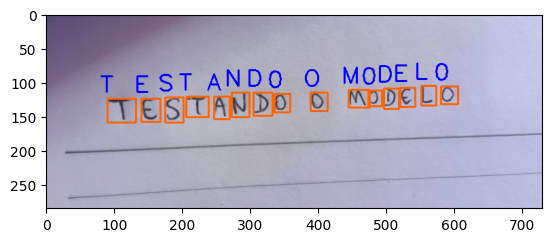

In [120]:
img_copy = img.copy()
for (prediction, (x, y, w, h)) in zip(predictions, boxes):
    i = np.argmax(prediction)
    probability = prediction[i]
    character = character_list[i]

    cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255, 100, 0), 2)
    cv2.putText(img_copy, character, (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0, 0, 255), 2)
    print(character, ' -> ', probability * 100)

    plt.imshow(img_copy)
    plt.show()

In [129]:
# 0과 O, 1과 l, 5와 S 인식 문제

def preprocess_img(img):
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray_img, (3, 3), 7)
    edges = cv2.Canny(blur, 40, 150)
    dilation = cv2.dilate(edges, np.ones((3, 3)))

    return gray_img, dilation

def prediction(predict, character_list):
    i = np.argmax(predict)
    probability = predict[i]
    character = character_list[i]

    return i, probability, character

def draw_box(copied_img, character, x, y, w, h):
    cv2.rectangle(copied_img, (x, y), (x + w, y + h), (255, 100, 0), 2)
    cv2.putText(copied_img, character, (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0, 0, 255), 2)

def process_box(gray, x, y, w, h):
    roi = extract_roi(gray)
    thresh = thresholding(roi)
    (h, w) = thresh.shape
    resized = resizing(thresh, w, h)
    plt.imshow(resized, cmap='gray')
    plt.show()
    normalized = normalization(resized)
    return (normalized, (x, y, w, h))
    # characters.append((normalized, (x, y, w, h)))

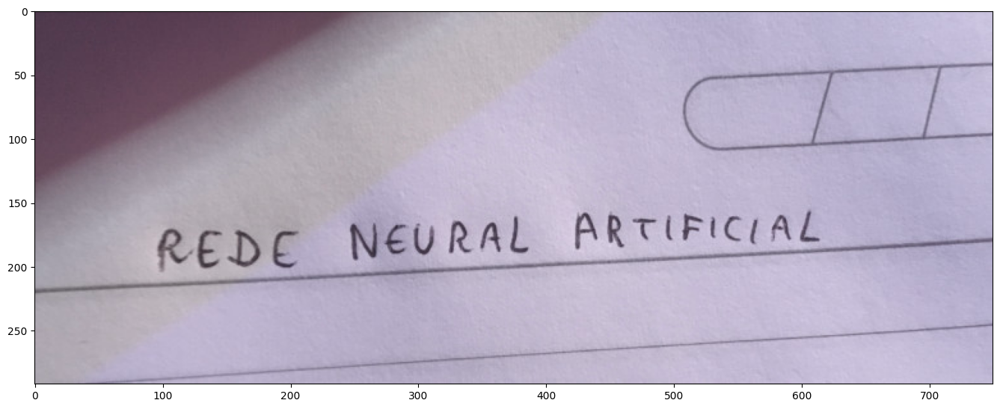

In [130]:
img = cv2.imread('./OCR_with_Python/Images/test_manuscript02.jpg')
display(img)

In [131]:
gray_img, processed_img = preprocess_img(img)

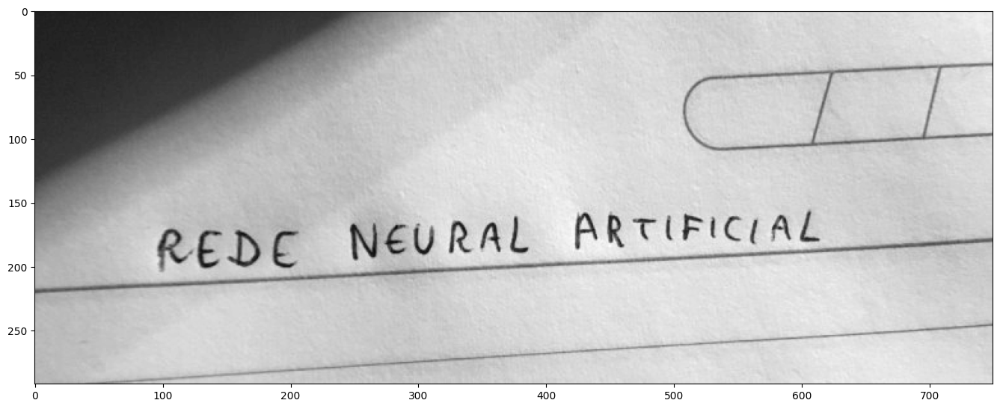

In [132]:
display(gray_img)

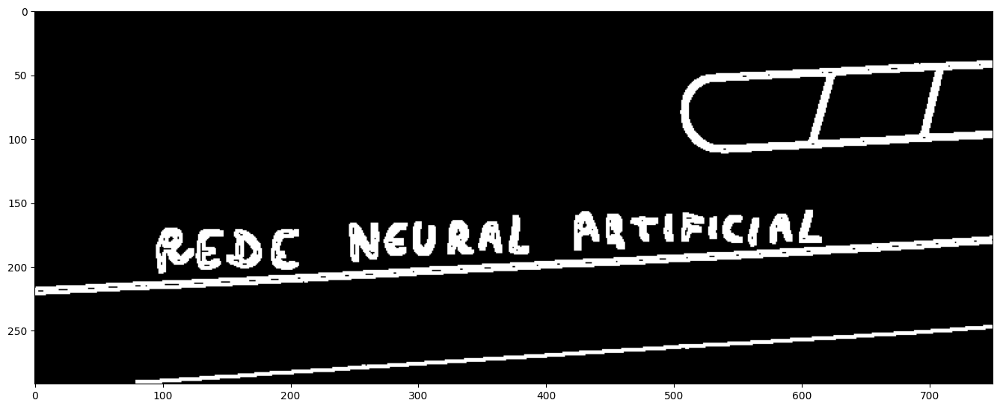

In [133]:
display(processed_img)

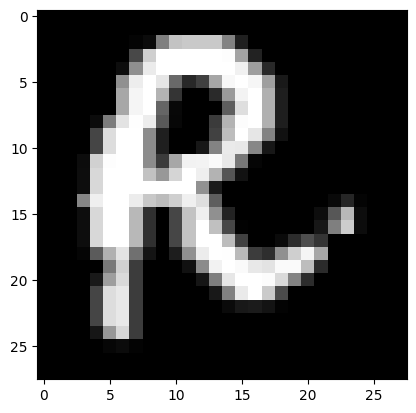

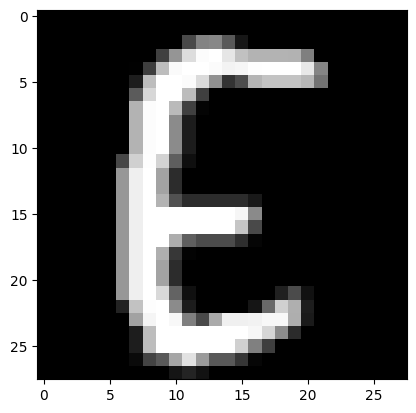

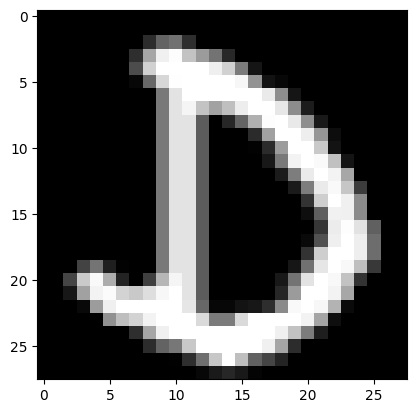

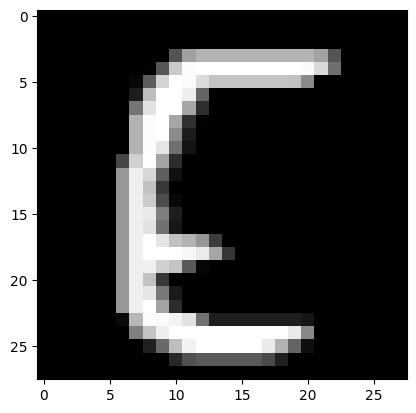

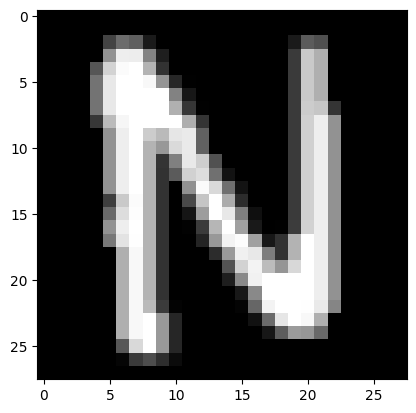

...

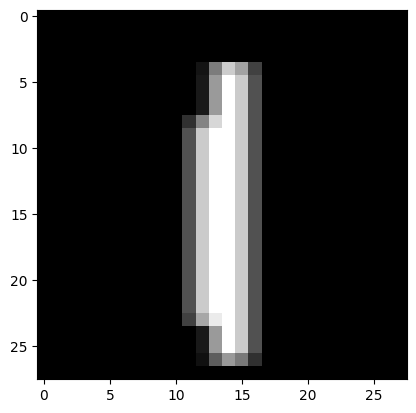

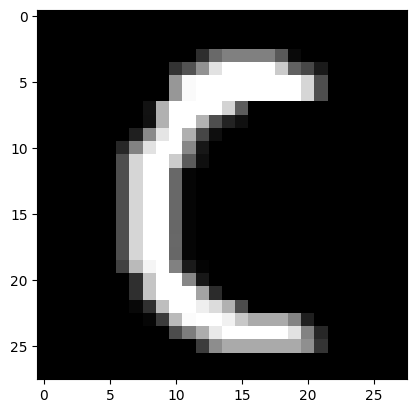

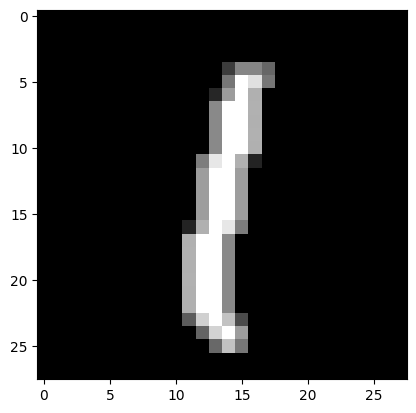

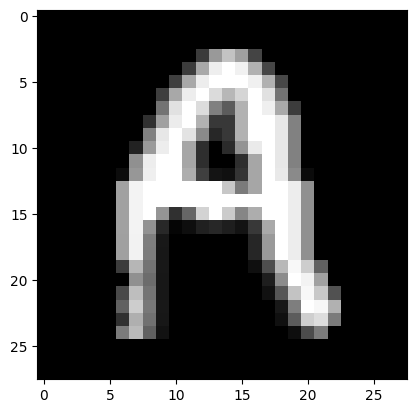

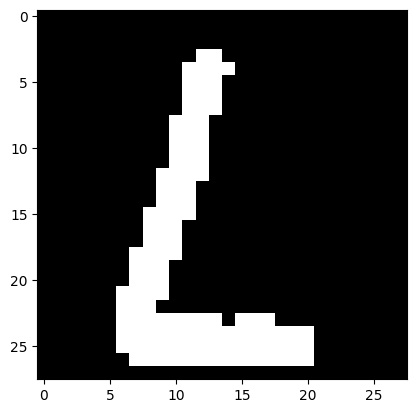

1/1 [==============================] - 0s 15ms/step


In [134]:
conts = find_contours(processed_img.copy())
characters = []
min_w, max_w = 4, 160
min_h, max_h = 14, 140

for c in conts:
    # print(c)
    (x, y, w, h) = cv2.boundingRect(c)
    if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
        characters.append(process_box(gray_img, x, y, w, h))
        
        # roi = gray_img[y:y+h, x:x+w]
        # plt.imshow(roi, cmap='gray')
        # plt.show()
        # thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        # # display(roi)
        # plt.imshow(thresh, cmap='gray')
        # plt.show()
        # cv2.rectangle(img_copy, (x, y), (x+w, y+h), (0, 100, 255), 2)

boxes = [b[1] for b in characters]
pixels = np.array([p[0] for p in characters], dtype='float32')
predictions = network.predict(pixels)

In [138]:
# 문자인식
digits2 = 'OI234S6789'
letters2 = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
character_list2 = digits2 + letters2
character_list2 = [l for l in character_list2]

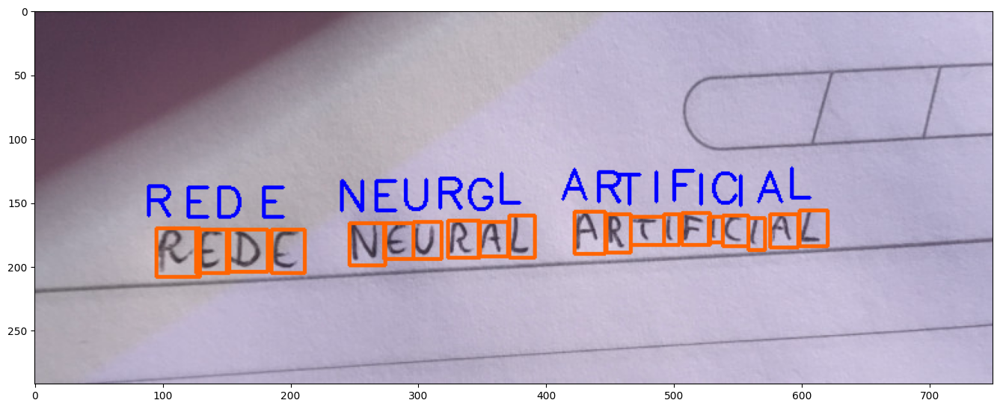

In [139]:
img_copy = img.copy()

for (predict, (x, y, w, h)) in zip(predictions, boxes):
    i, probability, character = prediction(predict, character_list2)
    draw_box(img_copy, character, x, y, w, h)
display(img_copy)

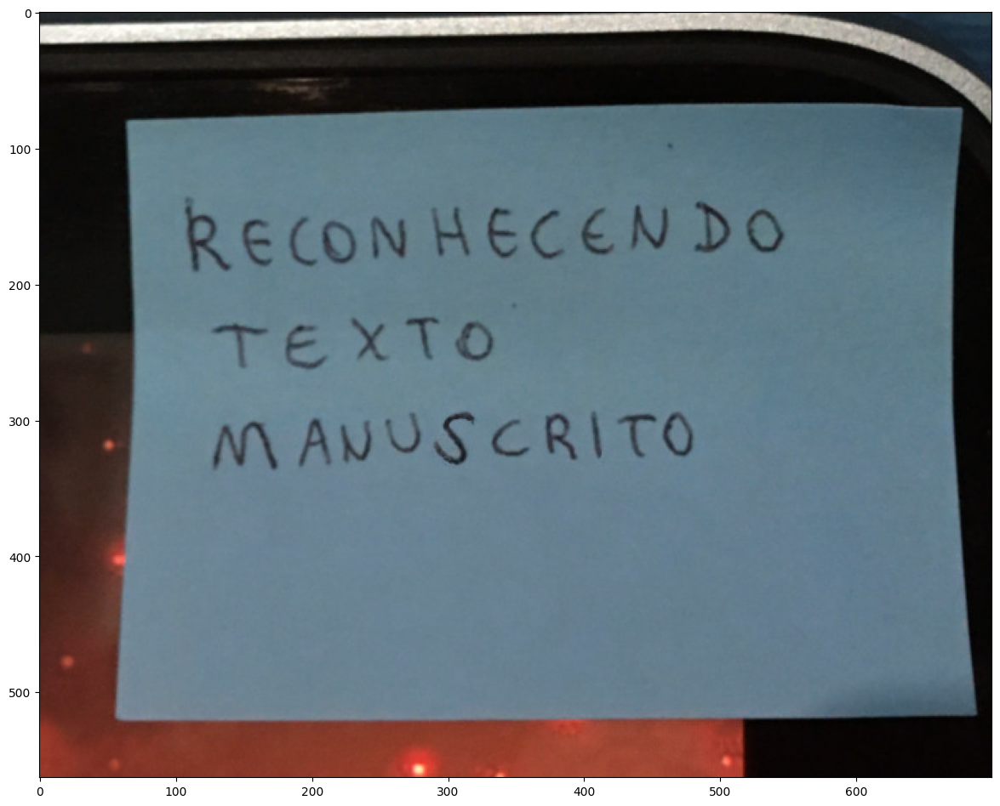

In [140]:
# 문자를 인식하지 못하는 문제 해결

img = cv2.imread('./OCR_with_Python/Images/test_manuscript03.jpg')
display(img)

In [141]:
gray_img, processed_img = preprocess_img(img)

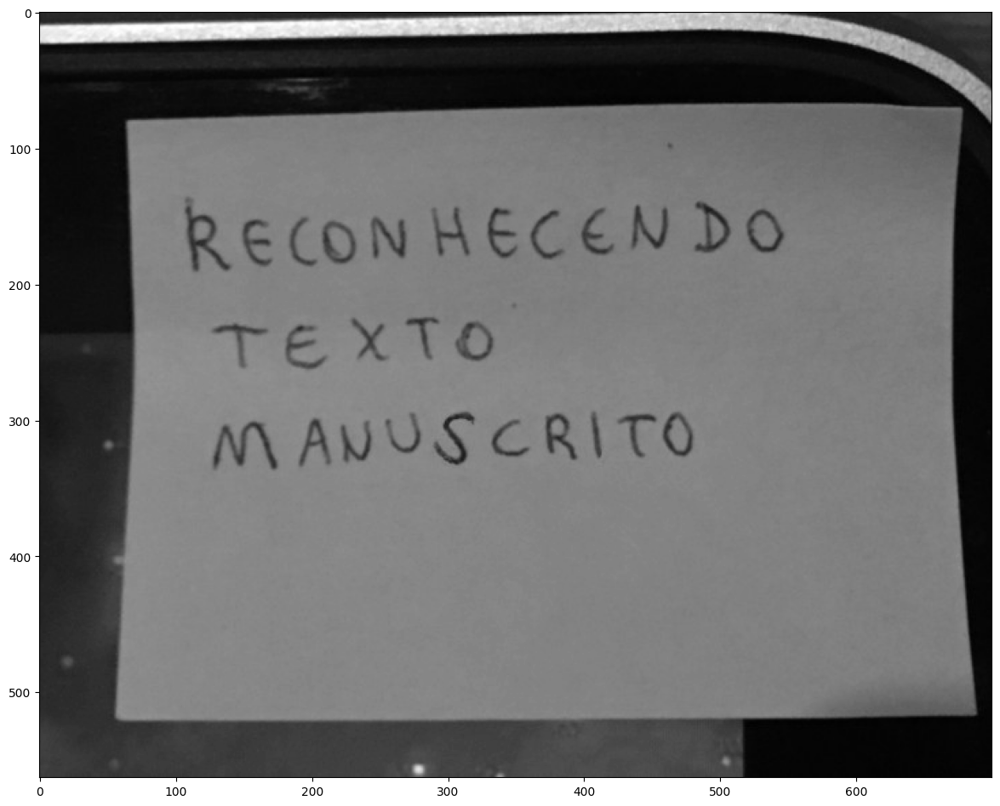

In [142]:
display(gray_img)

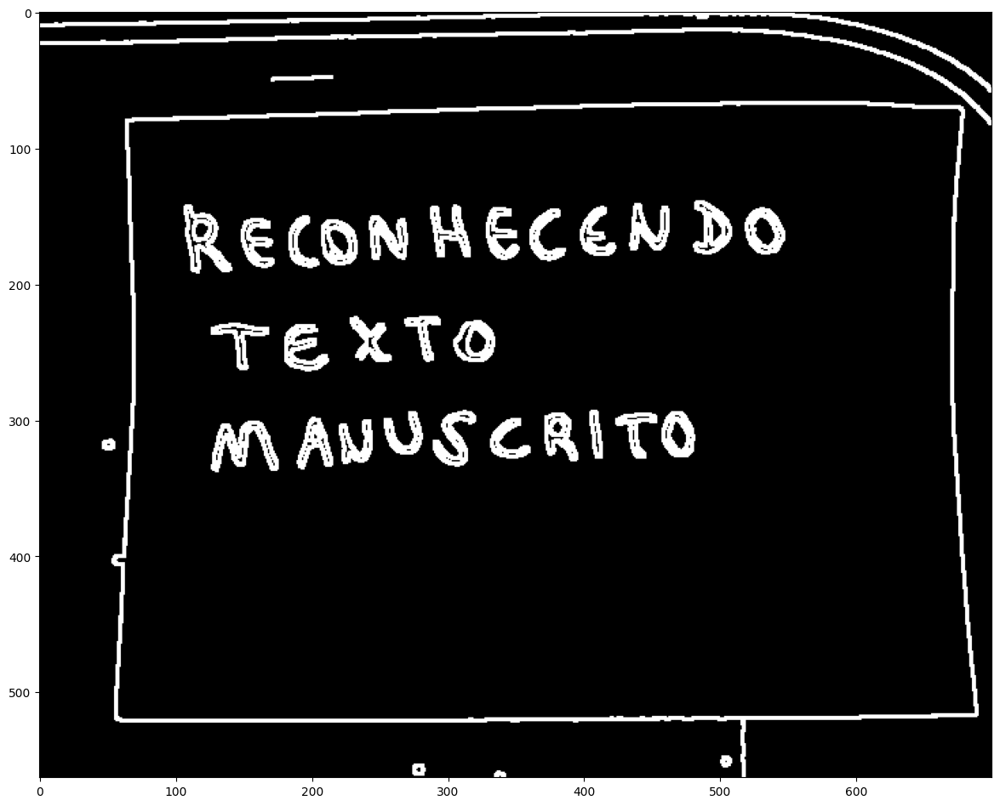

In [143]:
display(processed_img)

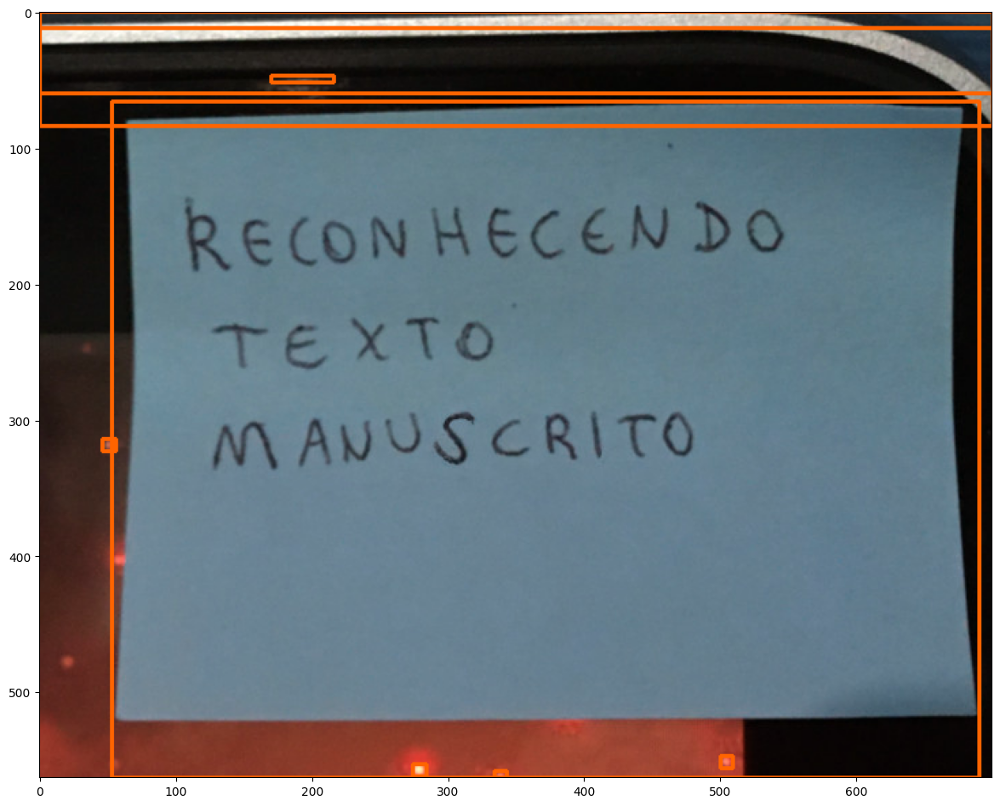

In [145]:
conts = find_contours(processed_img.copy()) # RETR_EXTERNAL로 검출을 시도 했기 때문에 발생 함.
img_copy = img.copy()

for c in conts:
    (x, y, w, h) = cv2.boundingRect(c)
    roi = gray_img[y:y+h, x:x+w]
    thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255, 100, 0), 2)
display(img_copy)

In [148]:
height, width = img.shape[:2]
print(height, width)

563 700


In [150]:
contours_size = sorted(conts, key=cv2.contourArea, reverse=True)
contours_size

[array([[[500,  66]],
 
        [[499,  67]],
 
        [[435,  67]],
 
        [[434,  68]],
 
        [[397,  68]],
 
        [[396,  69]],
 
        [[363,  69]],
 
        [[362,  70]],
 
        [[321,  70]],
 
        [[320,  71]],
 
        [[292,  71]],
 
        [[291,  72]],
 
        [[256,  72]],
 
        [[255,  73]],
 
        [[234,  73]],
 
        [[233,  74]],
 
        [[203,  74]],
 
        [[202,  75]],
 
        [[167,  75]],
 
        [[166,  76]],
 
        [[138,  76]],
 
        [[137,  77]],
 
        [[ 98,  77]],
 
        [[ 97,  78]],
 
        [[ 68,  78]],
 
        [[ 67,  79]],
 
        [[ 63,  79]],
 
        [[ 63, 101]],
 
        [[ 64, 102]],
 
        [[ 64, 122]],
 
        [[ 65, 123]],
 
        [[ 65, 156]],
 
        [[ 66, 157]],
 
        [[ 66, 184]],
 
        [[ 67, 185]],
 
        [[ 67, 208]],
 
        [[ 68, 209]],
 
        [[ 68, 287]],
 
        [[ 67, 288]],
 
        [[ 67, 304]],
 
        [[ 66, 305]],
 
        [[ 66, 3

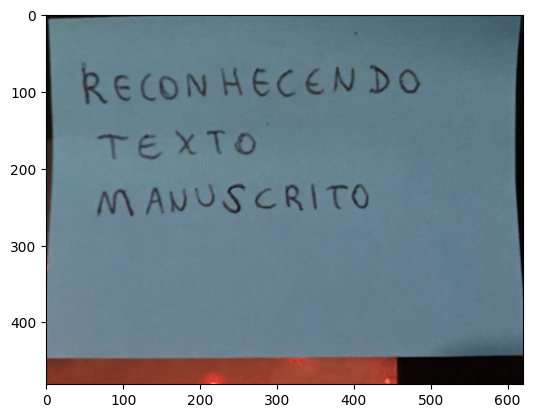

In [156]:
for c in contours_size:
    (x, y, w, h) = cv2.boundingRect(c)
    # print(x, y, w, h)
    if (w >= (width / 2)) and (h >= (height / 2)):
        cut_off = 8
        cut_img = img[y+cut_off: y + h - cut_off, x + cut_off: x + w - cut_off]
        plt.imshow(cut_img)
        plt.show()
        

In [159]:
gray_img, processed_img = preprocess_img(cut_img)

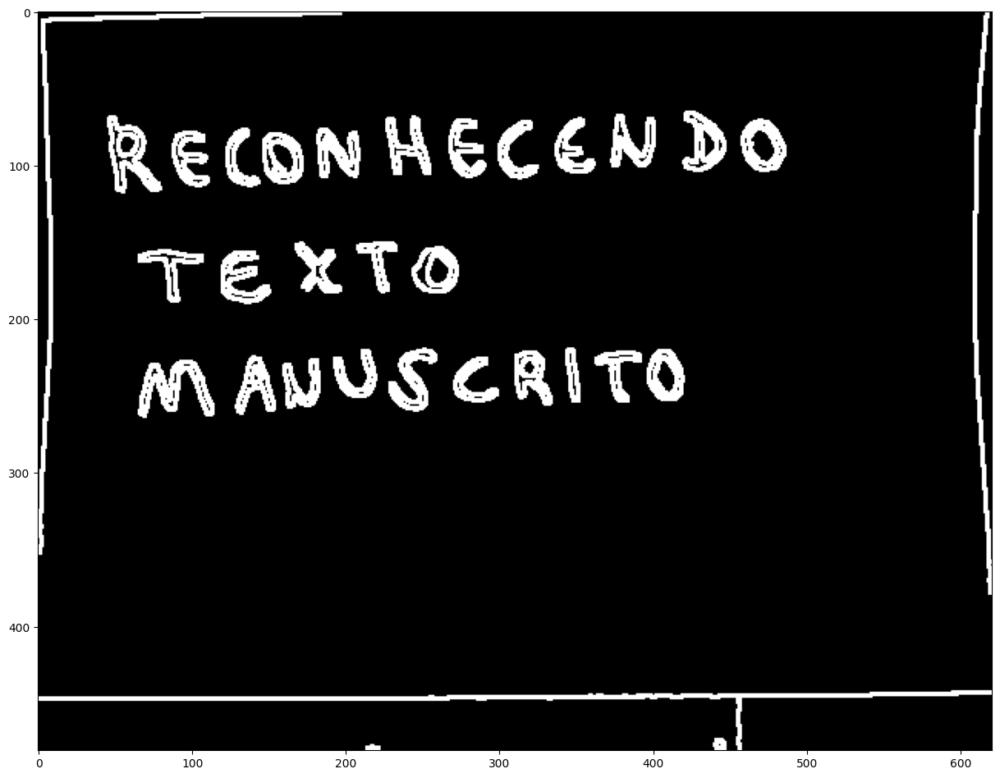

In [160]:
display(processed_img)

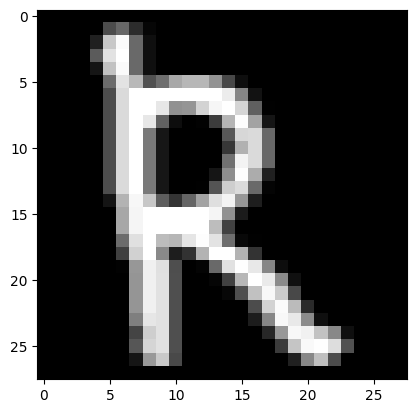

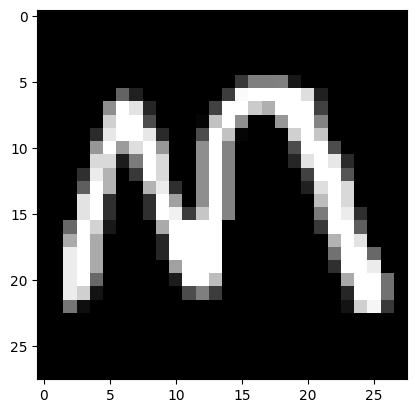

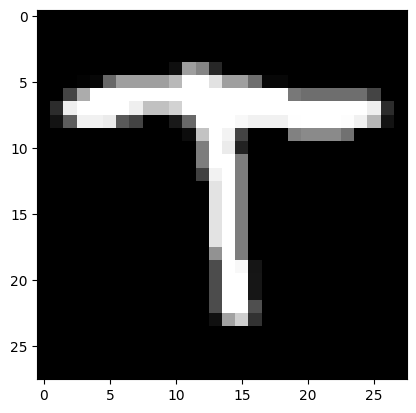

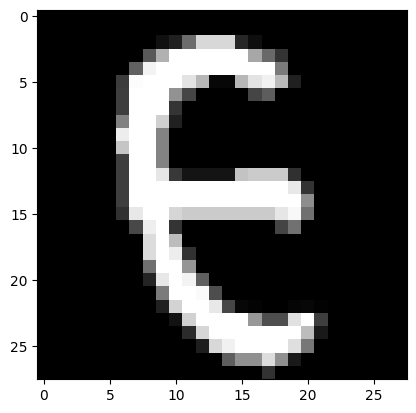

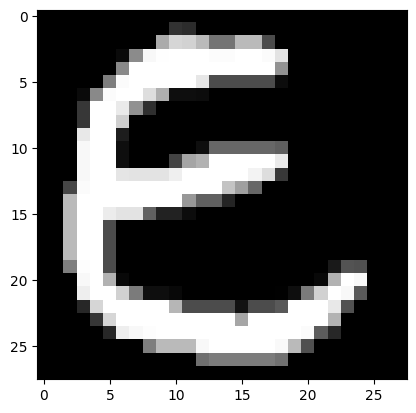

...

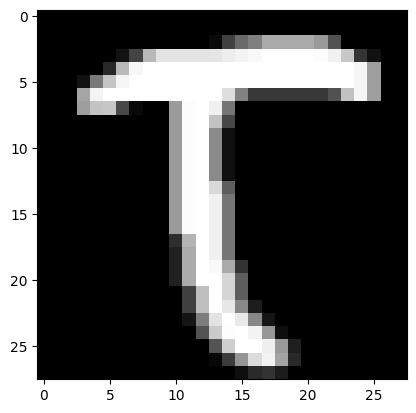

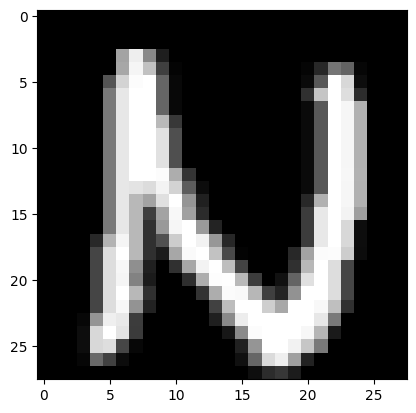

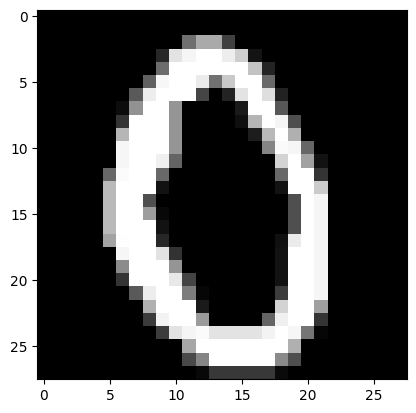

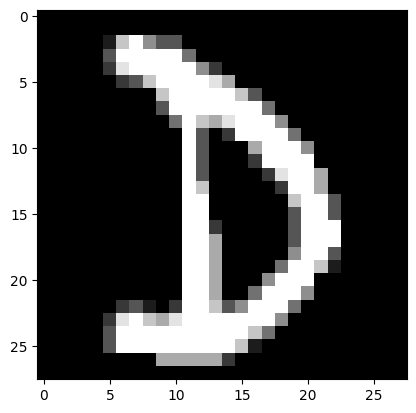

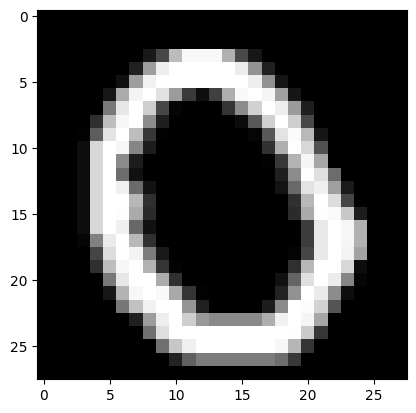

1/1 [==============================] - 0s 21ms/step


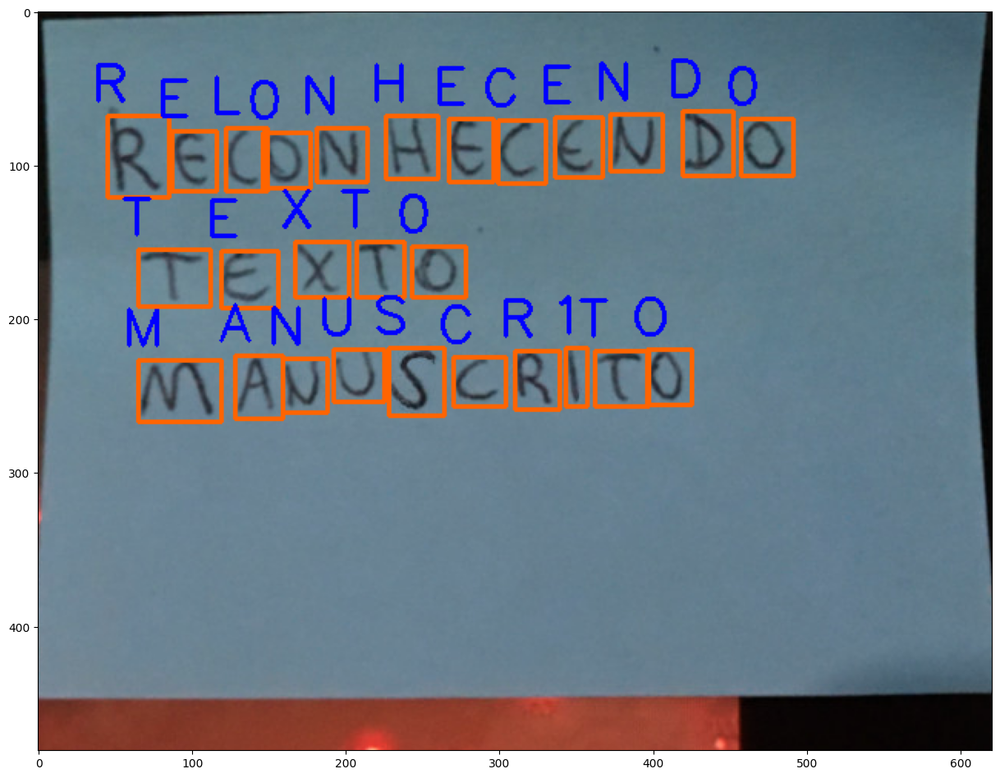

In [162]:
conts = find_contours(processed_img.copy()) # RETR_EXTERNAL로 검출을 시도 했기 때문에 발생 함.
characters = []

for c in conts:
    (x, y, w, h) = cv2.boundingRect(c)
    if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
        characters.append(process_box(gray_img, x, y, w, h))

boxes = [c[1] for c in characters]
pixels = np.array([c[0] for c in characters], dtype='float32')
predictions = network.predict(pixels)

img_copy = cut_img.copy()
for (predict, (x, y, w, h)) in zip(predictions, boxes):
    i, probability, character = prediction(predict, character_list)
    draw_box(img_copy, character, x, y, w, h)

display(img_copy)